In [58]:
%load_ext autoreload
%autoreload 2

from substrata import *

# Set up logging to be verbose (INFO)
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger('unicorn')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [122]:
plot = initializer.ProjectInitializer(path='/mnt/int_data/samoa_focal/sam_sa2/sam_sa2_60m/sam_sa2_60m_20250923/')
plot.initialize()

INFO:substrata.pointclouds:Loading in pointcloud /mnt/int_data/samoa_focal/sam_sa2/sam_sa2_60m/sam_sa2_60m_20250923/sam_sa2_60m_20250923_dec50M.ply...


Loading pointcloud from /mnt/int_data/samoa_focal/sam_sa2/sam_sa2_60m/sam_sa2_60m_20250923/sam_sa2_60m_20250923_dec50M.ply


INFO:substrata.pointclouds:Applied transform:
[[ 2.35159773e-02 -1.57391554e-01  1.56891855e-02  1.53210123e+01]
 [ 1.45543559e-01  1.53213944e-02 -6.44482761e-02  4.34599652e+00]
 [ 6.19299946e-02  2.37572432e-02  1.45504372e-01 -5.91660531e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


Loading cameras from /mnt/int_data/samoa_focal/sam_sa2/sam_sa2_60m/sam_sa2_60m_20250923/sam_sa2_60m_20250923.meta.json and /mnt/int_data/samoa_focal/sam_sa2/sam_sa2_60m/sam_sa2_60m_20250923/sam_sa2_60m_20250923.cams.xml


Loading markers from /mnt/int_data/samoa_focal/sam_sa2/sam_sa2_60m/sam_sa2_60m_20250923/sam_sa2_60m_20250923_markers.csv


In [123]:
plot.cams.group_names
for sensor in plot.cams.sensors.values():
    print(sensor.sensor_id, sensor.label, sensor.width, sensor.height)

0 ILCE-7RM5, FE 24mm F1.4 GM (24mm) 9568 6376
1 Canon EOS 5DS R, EF100mm f/2.8L Macro IS USM (100mm) 8726 5840
3 unknown 2816 2848
5 unknown 3840 2160


In [124]:
# // GoPro 09:18:37 and Photo 2599 is 09:19:53, so the offset is - 76sec
gopro_cams = plot.cams.subset_by_sensor(5)
gopro_cams.get_datetime_originals()
macro_cams = plot.cams.subset_by_sensor(1)
macro_cams.get_datetime_originals(offset_secs=-76)

Retrieving timestamps from camera files...: 100%|██████████| 51/51 [00:00<00:00, 1578.77it/s]


In [127]:
cam_offset_xyz = [0.0, 0.12, 0.0]

macro_cams.get_centers_and_transforms_based_on_timematch(gopro_cams, offset_xyz=cam_offset_xyz)#, cam_translate)

# marker = Annotation([36.76800315758567, -57.97541250684836, 6.4948765674380216])
# marker.transform_coords(plot.pcd.world_transform)

INFO:substrata.pointclouds:Building kdtree for /mnt/int_data/samoa_focal/sam_sa2/sam_sa2_60m/sam_sa2_60m_20250923/sam_sa2_60m_20250923_dec50M.ply...


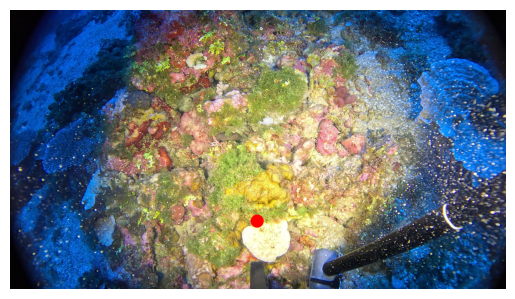

(5695, 2674, 2.2748852514355207, np.float64(6.337475851591114e-06))


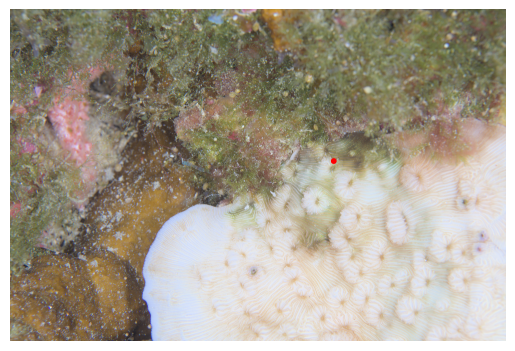

Image match for camera 1634 at 5695, 2674
Depth: 2.2748852514355207, Relevance: 6.337475851591114e-06
No obstruction check performed


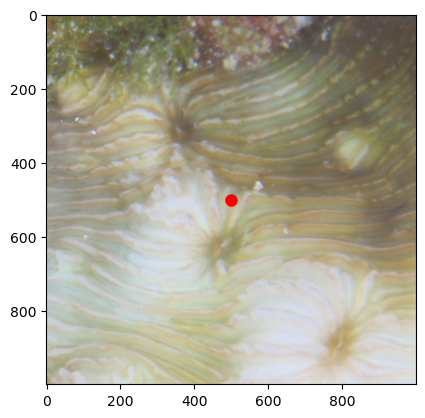

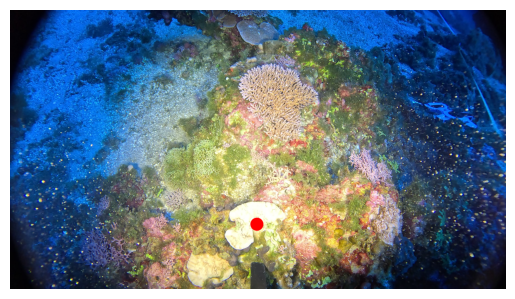

(5658, 3036, 2.273057902863016, np.float64(5.6669521380546725e-06))


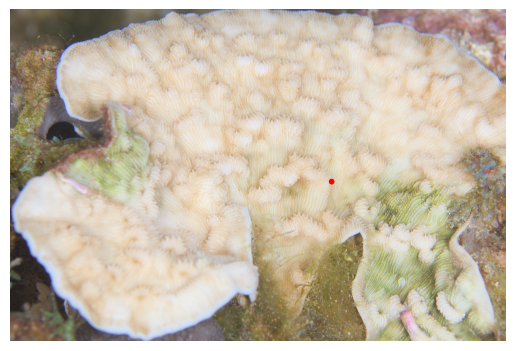

Image match for camera 1635 at 5658, 3036
Depth: 2.273057902863016, Relevance: 5.6669521380546725e-06
No obstruction check performed


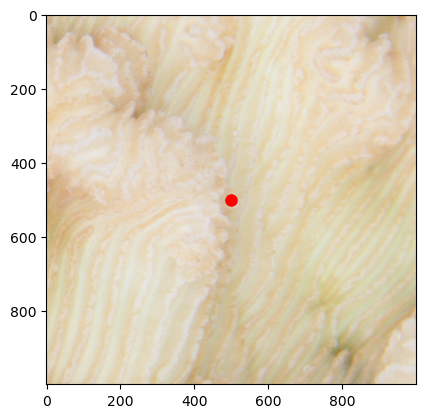

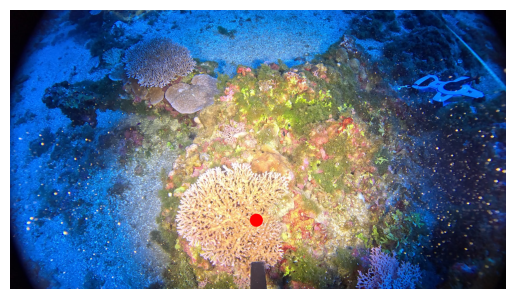

(5610, 3415, 2.5360305843592386, np.float64(7.843391843726883e-06))


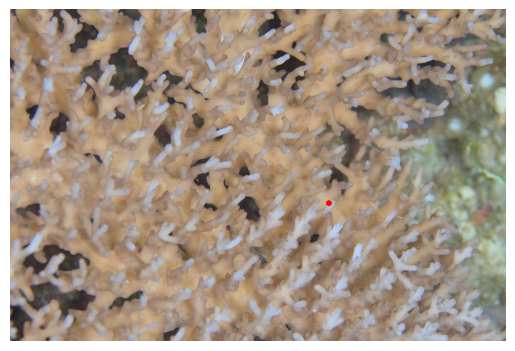

Image match for camera 1636 at 5610, 3415
Depth: 2.5360305843592386, Relevance: 7.843391843726883e-06
No obstruction check performed


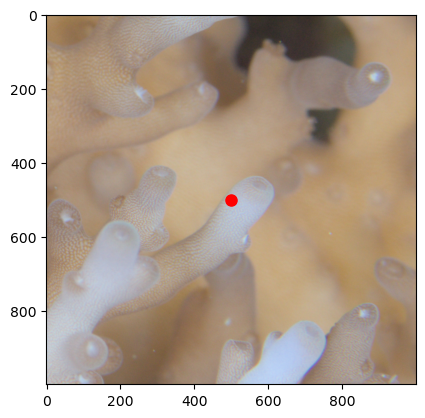

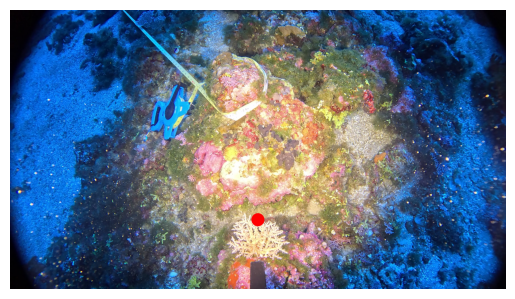

(5774, 3143, 2.4674987889177444, np.float64(7.150849854669022e-06))


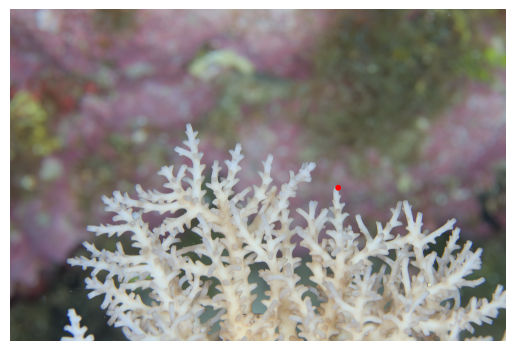

Image match for camera 1637 at 5774, 3143
Depth: 2.4674987889177444, Relevance: 7.150849854669022e-06
No obstruction check performed


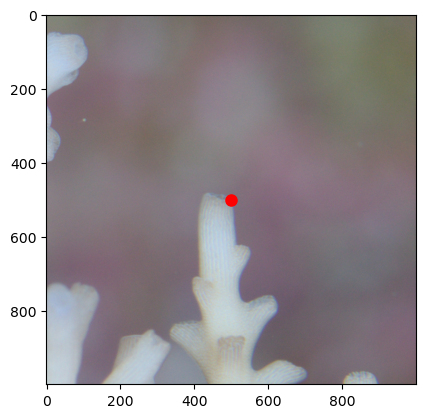

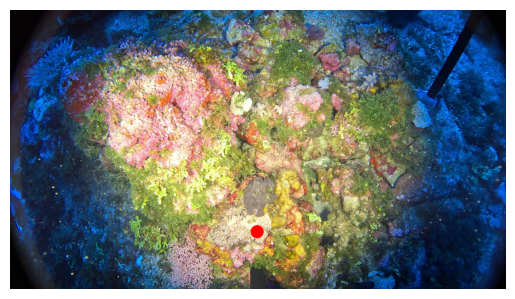

(5695, 2991, 2.042004174945397, np.float64(5.032110293207609e-06))


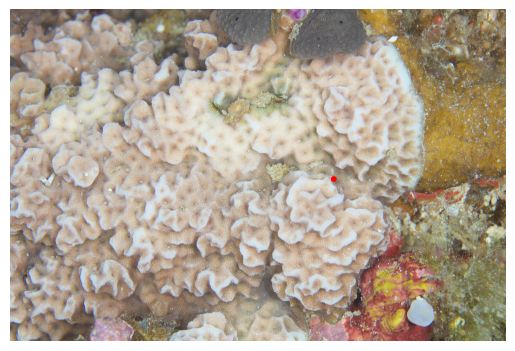

Image match for camera 1638 at 5695, 2991
Depth: 2.042004174945397, Relevance: 5.032110293207609e-06
No obstruction check performed


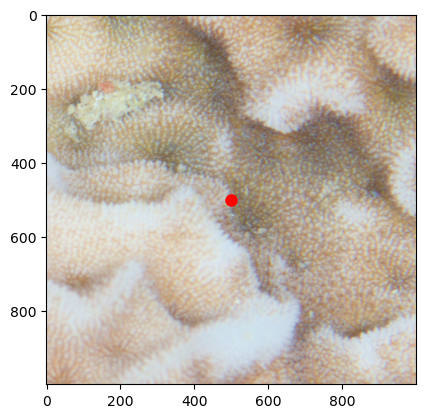

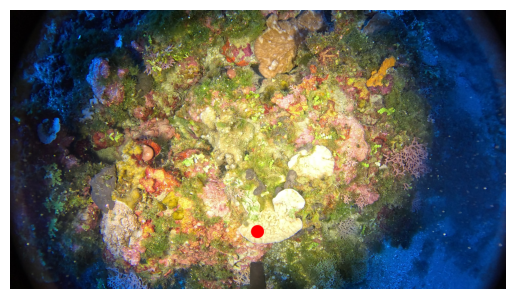

(5729, 3095, 2.0685724035029445, np.float64(5.598761610491462e-06))


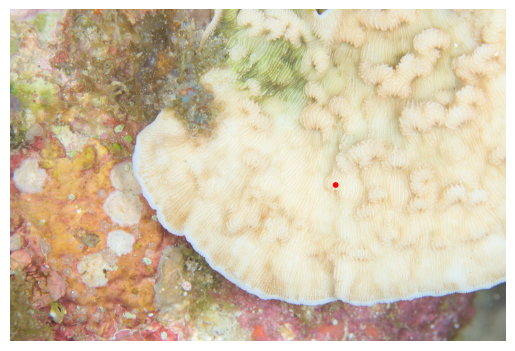

Image match for camera 1639 at 5729, 3095
Depth: 2.0685724035029445, Relevance: 5.598761610491462e-06
No obstruction check performed


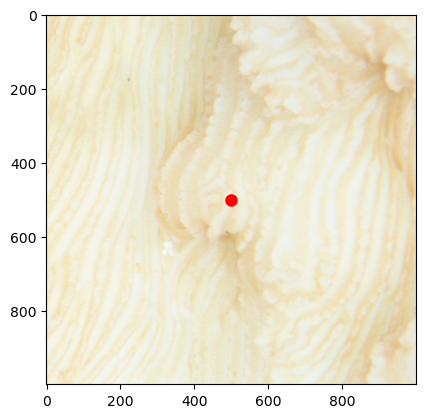

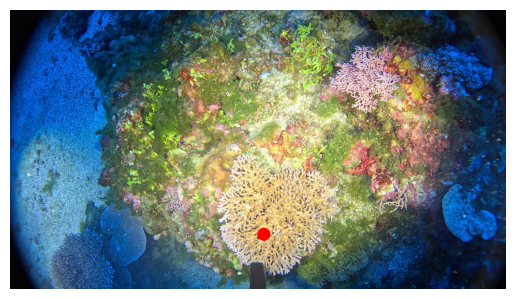

(6439, 3081, 1.9915831369141301, np.float64(7.799274172531979e-06))


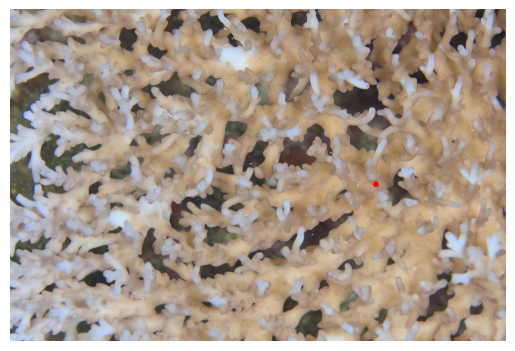

Image match for camera 1640 at 6439, 3081
Depth: 1.9915831369141301, Relevance: 7.799274172531979e-06
No obstruction check performed


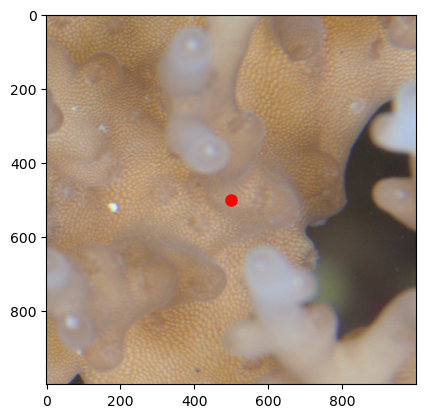

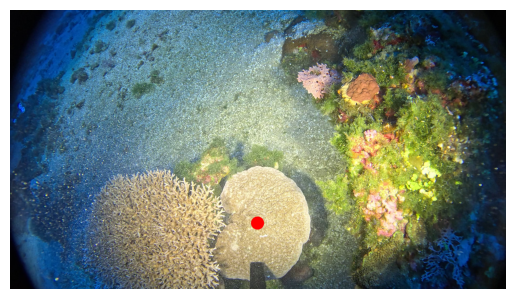

(5734, 3350, 2.4054660808354456, np.float64(7.665448434183096e-06))


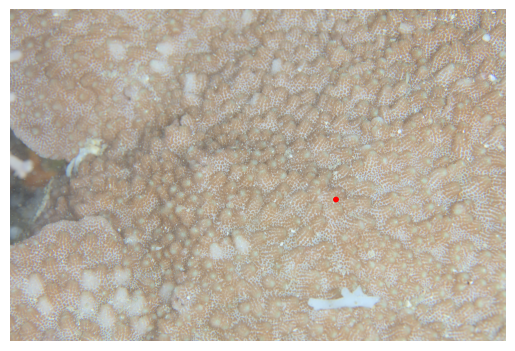

Image match for camera 1641 at 5734, 3350
Depth: 2.4054660808354456, Relevance: 7.665448434183096e-06
No obstruction check performed


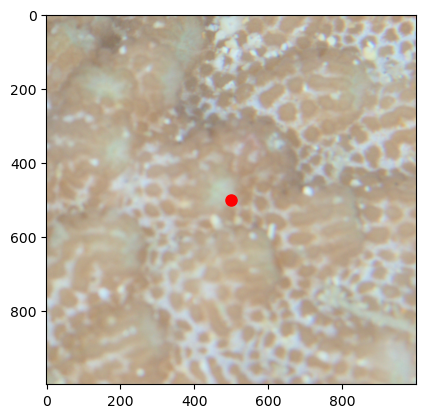

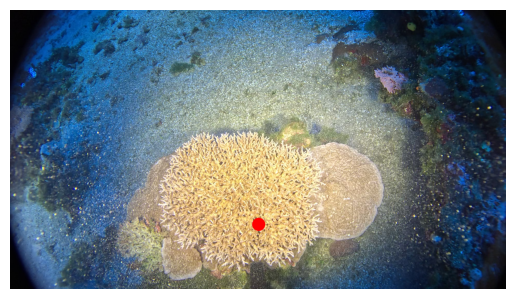

(5858, 3075, 2.2814490467794926, np.float64(6.644828525528826e-06))


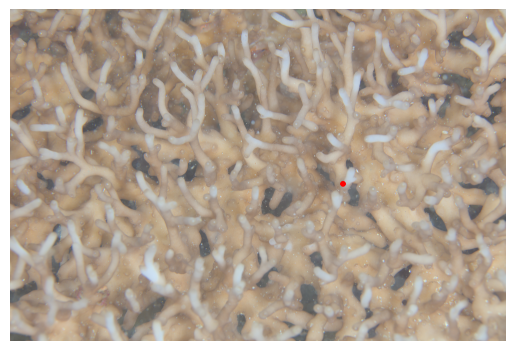

Image match for camera 1642 at 5858, 3075
Depth: 2.2814490467794926, Relevance: 6.644828525528826e-06
No obstruction check performed


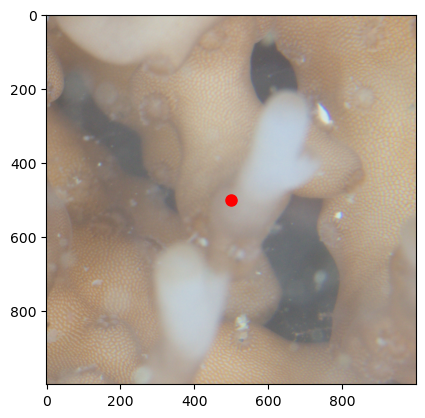

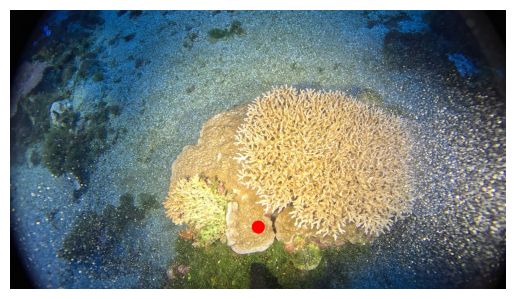

(5813, 3067, 2.1925902095492376, np.float64(6.171782584925627e-06))


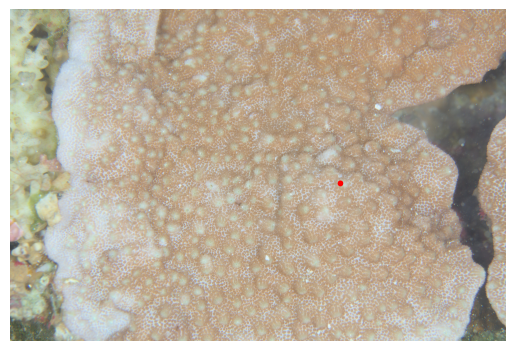

Image match for camera 1643 at 5813, 3067
Depth: 2.1925902095492376, Relevance: 6.171782584925627e-06
No obstruction check performed


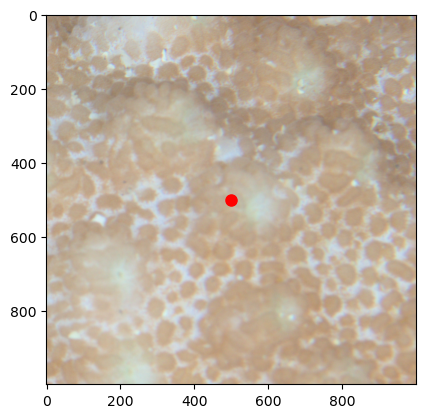

In [128]:
matches = macro_cams.get_timematches(gopro_cams)
for match in matches[0:10]:
    macro = match[0]
    gopro = match[1]
    macro_intercept = plot.pcd.get_intercept(macro.coords, 0.01, vector=macro.vector)
    gopro_highlight = gopro.get_pixel_coords(macro_intercept.coords, required_to_be_in_view=False, use_orig_coords=False)
    macro_highlight = macro.get_pixel_coords(macro_intercept.coords, required_to_be_in_view=False, use_orig_coords=False)
    visualizations.show_img(gopro.filepath, gopro_highlight)
    print(macro_highlight)
    visualizations.show_img(macro.filepath, macro_highlight)
    match = macro_intercept.get_first_image_match(macro_cams, use_orig_coords=False)
    if match is not None:
        match.show()